In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pickle
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15,5)
plt.rcParams['axes.grid'] = False
import itertools
import multiprocessing
import seaborn as sns
sns.set_style("whitegrid", {'axes.grid' : False})
import numpy as np
import os

In [4]:
with open(f'ETH_VolumeLevels_Hourly.pkl', 'rb') as file:
    temp = pickle.load(file)
temp = temp[temp["Datetime"] < "2019-03-01"]
with open(f'ETH_M.pkl', 'rb') as file:
    temp_og = pickle.load(file)
temp = pd.concat([temp.set_index("Datetime"), temp_og.set_index("Datetime")], axis=1, join="inner").reset_index()

  0%|          | 20/12934 [00:00<06:56, 31.03it/s]C:\Users\suprabhashsahu\Desktop\Volume-Constance-Brown\venv\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
100%|██████████| 12934/12934 [33:57<00:00,  6.35it/s]  


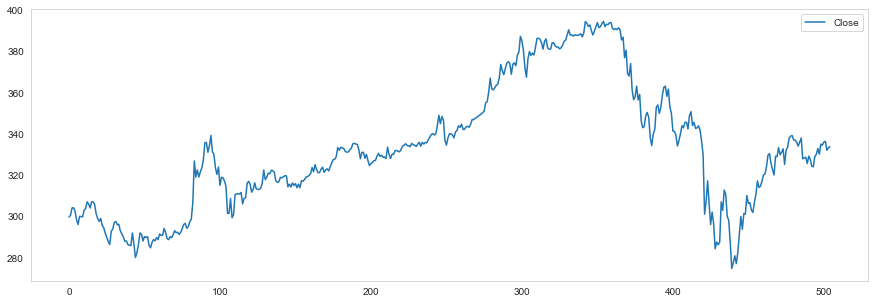

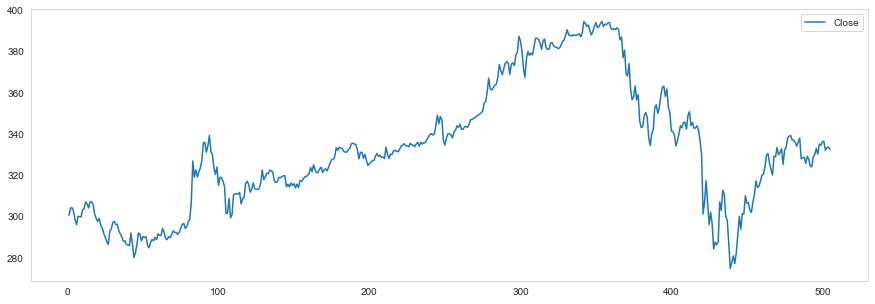

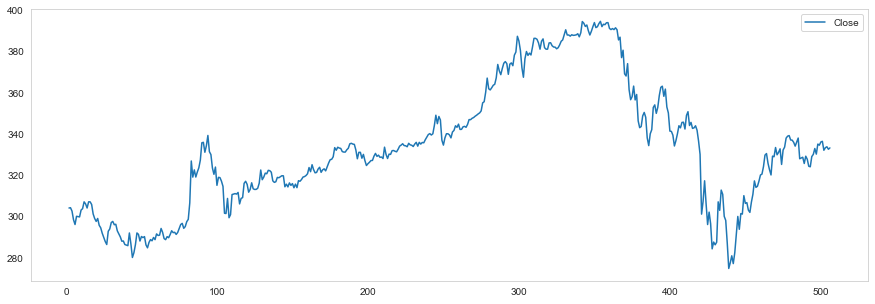

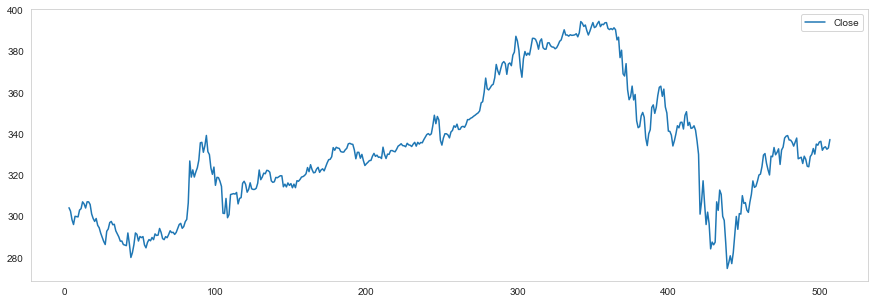

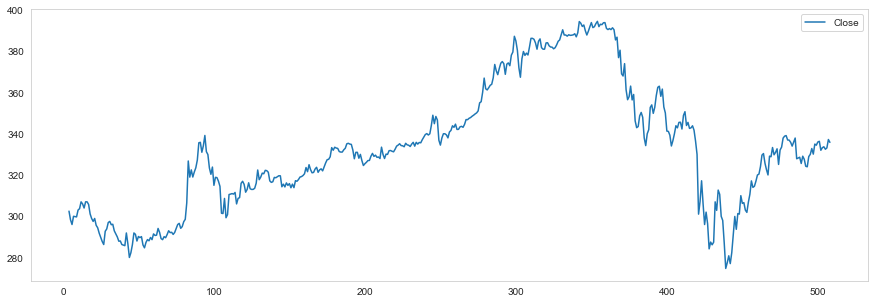

...

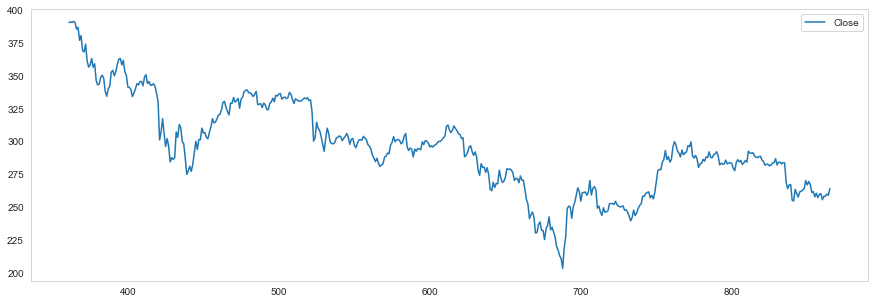

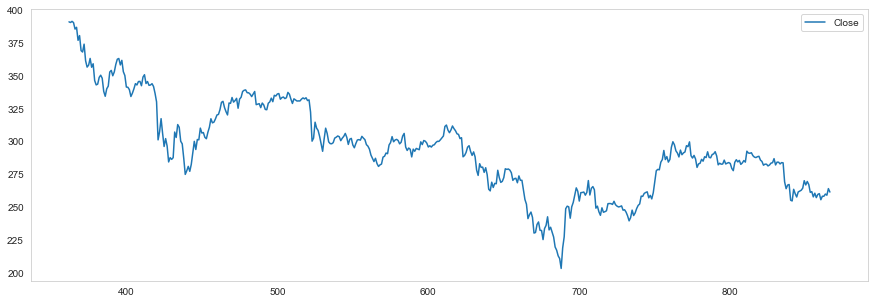

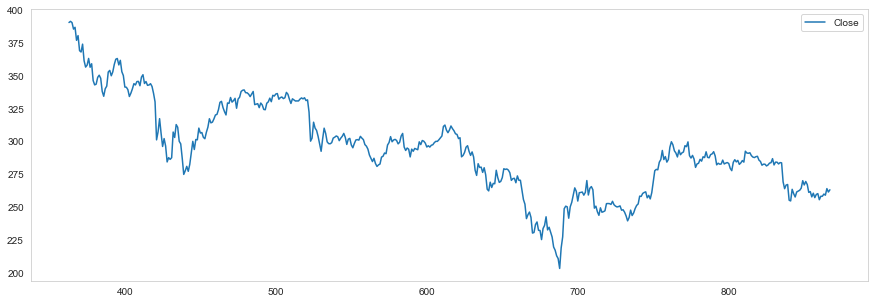

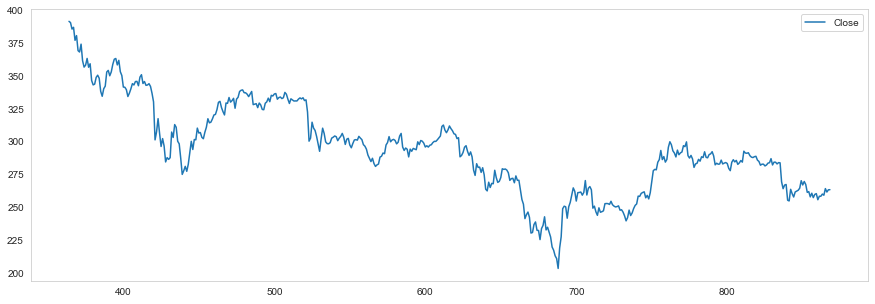

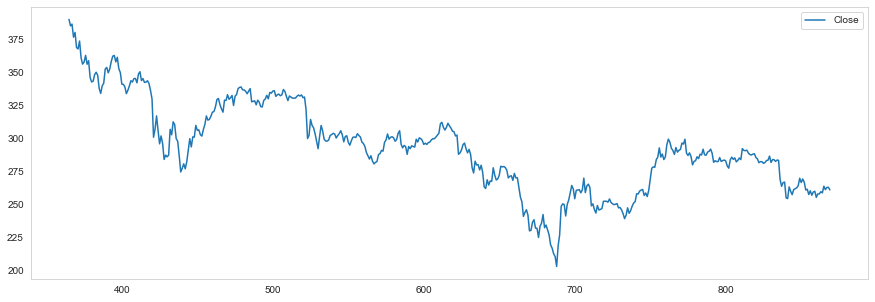

In [ ]:
lookahead = 1
for i in tqdm(range(504+lookahead,len(temp))):
    ax1 = temp.iloc[i-504-lookahead:i][["Close"]].plot()
    try:
        if os.path.isfile(f"{i}.jpg"):
            continue
        for lookback in [2,5,10,21,42,63,126,252,504]:
            dict = temp.iloc[i-lookahead][f"PriceLevels_{lookback}"]
            poc = dict["poc"]
            profile_high = dict["profile_high"]
            profile_low = dict["profile_low"]
            vah = dict["vah"]
            val = dict["val"]
            # plt.plot((temp.index[i-lookback], poc), (temp.index[i], poc))
            # ax1.hlines(y=poc, xmin=[i-lookback-lookahead], xmax=[i-lookahead],  color="orange")
            # ax1.hlines(y=profile_high, xmin=[i-lookback-lookahead], xmax=[i-lookahead],   color="darkgreen")
            # ax1.hlines(y=profile_low, xmin=[i-lookback-lookahead], xmax=[i-lookahead],   color="maroon")
            # ax1.hlines(y=vah, xmin=[i-lookback-lookahead], xmax=[i-lookahead],   color="lime")
            # ax1.hlines(y=val, xmin=[i-lookback-lookahead], xmax=[i-lookahead],   color="red")
            # ax1.vlines(x=i-lookahead, ymin = temp.iloc[i-504-lookahead:i]["Close"].min(), ymax = temp.iloc[i-504-lookahead:i]["Close"].max(), color="black")

            ax1.hlines(y=poc, xmin=[i-lookback-lookahead], xmax=[i],  color="orange")
            ax1.hlines(y=profile_high, xmin=[i-lookback-lookahead], xmax=[i],   color="darkgreen")
            ax1.hlines(y=profile_low, xmin=[i-lookback-lookahead], xmax=[i],   color="maroon")
            ax1.hlines(y=vah, xmin=[i-lookback-lookahead], xmax=[i],   color="lime")
            ax1.hlines(y=val, xmin=[i-lookback-lookahead], xmax=[i],   color="red")
            ax1.vlines(x=i-lookahead, ymin = temp.iloc[i-504-lookahead:i]["Close"].min(), ymax = temp.iloc[i-504-lookahead:i]["Close"].max(), color="black")
        plt.legend(["Close","Point of Control", "Profile High", "Profile Low", "Value Area High", "Value Area Low"])
        plt.savefig(f"{i}.jpg")
        #plt.show()
        plt.clf()
    except:
        pass


In [5]:
import cv2
import numpy as np
import glob

img_array = []
for filename in glob.glob('*.jpg'):
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)
    os.remove(filename)

out = cv2.VideoWriter('NSEI.avi',cv2.VideoWriter_fourcc(*'MJPG'), 15, size)

for i in range(len(img_array)):
    out.write(img_array[i])
out.release()


error: OpenCV(4.5.5) D:\a\opencv-python\opencv-python\opencv\modules\core\src\alloc.cpp:73: error: (-4:Insufficient memory) Failed to allocate 1166400 bytes in function 'cv::OutOfMemoryError'
